# Modelo de estimación de la velocidad #2

### Este modelo busca pasar por anycalib el video y aprender la escala a partir del prior de que el ancho de un auto estandar es 1.9 metros

conculsiones: el modelo funciona bien en terminos generales, pero no en terminos de escala. Lo rapido es rapido, lo lento es lento, pero no lo suficientemente rapido en general. 
esto se debe a que el prior que usamos es horizontal, y la velocidad va vertical en estos videos, por lo que aprende un factor que acorta las velocidades.

Pros del modelo: no necesitas tomar puntos de la imagen ni priors extraibles. se aprovecha el trabajo realizado con YOLO para estimar la relacion unidades AnyCalib --> mundo

Desventajas: este dataset usa videos en los que se ve a los autos un poco desde atras, por lo que no se puede tomar como prior el largo del auto desde la bounding box, porque esta no lo estima bien. Por lo que al usar bounding boxes solo nos queda usar el ancho en este caso, que estima todo por debajo

In [8]:
from src.yolo import run_yolo_tracking
from src.processing import  prepare_ground_truth_with_speed, align_yolo_with_ground_truth, filter_all_tracks, prepare_frame_level_train_test
from src.anycalib import select_best_frames, run_anycalib_pipeline, average_bbox_width_in_roi, estimate_global_scale_from_dataset, compute_speeds_for_all_cars
from src.metrics import evaluate_split


import torch
import numpy as np
import pandas as pd
from PIL import Image
import glob, os
import matplotlib.pyplot as plt
import torch.nn.functional as F
from anycalib import AnyCalib


## Train

### Etapa YOLO


In [2]:


csv_path, video_dir = run_yolo_tracking(
    weights_path="src./finetuned-detrac-weights.pt",
    video_source="data/raw/video3/video3_raw.mp4",
    base_dir="data/processed/video3",
    csv_filename="video3_track.csv",
    run_name="yolo_track_video3",
    conf=0.5,
    iou=0.6,
)



video 1/1 (frame 1/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 65.8ms
video 1/1 (frame 2/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 14.5ms
video 1/1 (frame 3/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 7.6ms
video 1/1 (frame 4/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 7.7ms
video 1/1 (frame 5/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 7.0ms
video 1/1 (frame 6/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 7.6ms
video 1/1 (frame 7/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 14.6ms
video 1/1

### preprocesamiento del resultado de YOLO

YOLO detecta muchos vehiculos que el ground truth no tiene, asi que vamos a eliminar esas detecciones innecesara.
Tambien difieren en ID, asi que tambien hacemos que coincida el ID del vehiculo en ambos dataset

In [9]:


prepare_ground_truth_with_speed(
    input_xml="data/raw/video3/gt_video3_raw.xml",
    filtered_xml="data/processed/video3/gt/gt_video3_processed.xml",
    output_csv="data/processed/video3/gt/gt_video3_processed.csv"
)

[filter_vehicles_with_radar] Vehículos totales en data/raw/video3/gt_video3_raw.xml: 550
[filter_vehicles_with_radar] Vehículos sin radar eliminados: 53
[filter_vehicles_with_radar] Vehículos restantes con radar: 497
[filter_vehicles_with_radar] XML filtrado guardado en: data/processed/video3/gt/gt_video3_processed.xml
[convert_xml_to_csv] Vehículos procesados: 497
[convert_xml_to_csv] CSV guardado en: data/processed/video3/gt/gt_video3_processed.csv


In [10]:


df_aligned, mapping = align_yolo_with_ground_truth(
    yolo_tracks_csv="data/processed/video3/video3_track.csv",
    gt_csv="data/processed/video3/gt/gt_video3_processed.csv",
    output_aligned_csv="data/processed/video3/video3_track_id.csv",
    frame_tolerance=1,
)


Coincidencias encontradas: 473 de 497 vehículos GT
Total de vehículos únicos preservados: 473

Proceso de alineación completado.


In [11]:

df_all_stable = filter_all_tracks(
    input_csv="data/processed/video3/video3_track_id.csv",
    output_csv="data/processed/video3/video3_track_id_filtered.csv",
    orig_h=1080,
    margin_bottom_px=20,
    margin_top_px=50,  
)


Tracks encontrados: [   1    5    7   12   15   16   17   28   31   35   38   40   41   47   50   56   58   60   61   67   70   83   89   91   92   96   98  107  119  124  125  164  196  203  207  220  221  226  238  242  243  244  246  247  253  259  265  268  269  272  275  285  289  292  299  302  317  326  330  332  343  346  350
  351  355  359  360  364  371  372  376  383  386  402  409  446  452  459  464  466  476  487  501  505  510  519  524  527  530  538  539  540  546  552  559  561  570  572  576  579  584  586  617  619  625  628  631  636  639  655  660  664  682  690  695  696  700  701  705  711  724  726  748  762  770  778
  799  807  813  816  817  819  823  824  835  837  849  852  858  869  874  879  881  882  884  899  902  919  923  926  927  928  940  943  947  951  954  956  963  964  966  978  982  989  995  997 1001 1007 1028 1088 1103 1112 1117 1124 1140 1145 1150 1152 1161 1167 1170 1173 1177 1178 1184 1186 1191 1200 1203
 1212 1219 1224 1232 1241 1254 1

In [12]:


df_train, df_test = prepare_frame_level_train_test(
    tracks_csv="data/processed/video3/video3_track_id_filtered.csv",
    gt_csv="data/processed/video3/gt/gt_video3_processed.csv",
    fps=25.0,
    test_size=0,
    random_seed=42,
    train_out="data/processed/video3/train_video3.csv",
    test_out="data/processed/video3/test_video3.csv",
    min_frames_per_gt=None,   
)


Vehículos con tracks:          470
Vehículos con GT de velocidad: 497
Vehículos en intersección:     470

Split por vehículo (IDs):
  Total vehículos: 470
  Train IDs:       470
  Test IDs:        0

Filas a nivel frame:
  Train frames: 21411
  Test frames:  0

Archivos generados:
  - data/processed/video3/train_video3.csv
  - data/processed/video3/test_video3.csv


### Etapa Anycalib


In [14]:

select_best_frames(
    video_path="data/raw/video3/video3_raw.mp4",
    output_dir="src/anycalib_frames_3",
    num_frames=12,
    frame_step=30,
    resize_width=None
)


Seleccionando 12 mejores frames
Listo! Se guardaron 13 frames en 'src/anycalib_frames_3'.


In [15]:
ORIG_W = 1920
ORIG_H = 1080
FRAME_DIR = "src/anycalib_frames_3"

frame_paths = sorted(glob.glob(os.path.join(FRAME_DIR, "*")))
assert len(frame_paths) > 0, "No encontré imágenes en anycalib_frames/"
calib_frame_path = frame_paths[0]  

print("Frame de calibración:", calib_frame_path)


Frame de calibración: src/anycalib_frames_3\anycalib_frame_000000.png


Tamaño imagen de calibración (H, W): (1080, 1920)


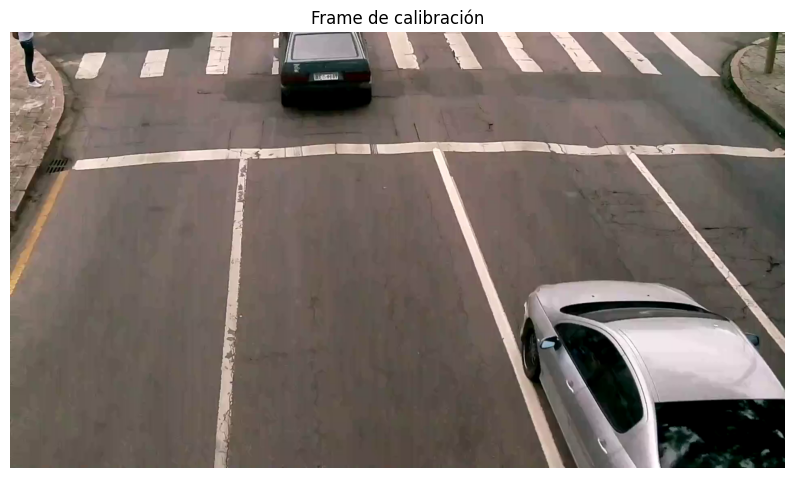

In [16]:
img = Image.open(calib_frame_path).convert("RGB")
img_np = np.array(img)
H, W, _ = img_np.shape

print("Tamaño imagen de calibración (H, W):", (H, W))

plt.figure(figsize=(10,6))
plt.imshow(img_np)
plt.title("Frame de calibración")
plt.axis("off")
plt.show()


In [17]:


img_np = np.array(Image.open("src/anycalib_frames_3/anycalib_frame_000000.png").convert("RGB"))

res = run_anycalib_pipeline(img_np)

intrinsics = res["intrinsics"]
rays_dir_full = res["rays_dir_full"]
pixel_to_world = res["pixel_to_world"]
pixel_to_world_from_yolo = res["pixel_to_world_from_yolo"]
H = res["H"]
W = res["W"]



Device: cuda
Intrinsics: tensor([1851.4703, 1838.2463,  958.4194,  539.8022], device='cuda:0')
pred_size: (238, 420)
rays shape: torch.Size([99960, 3])
rays_dir_full shape: (1080, 1920, 3)


c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\src\anycalib.py:155: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torch.tensor(rays_dir, dtype=torch.float32, device=device)


In [18]:

df_train_tracks = pd.read_csv("data/processed/video3/train_video3.csv")

mean_w_roi, median_w_roi, n_roi = average_bbox_width_in_roi(
    df=df_train_tracks,
    class_ids=(0,),          
    min_conf=0.5,            
    x_left_trim_ratio=0.33,  
    x_right_trim_ratio=0.43, 
    y_top_trim_ratio=0.33,   
    y_bottom_trim_ratio=0.33,
    img_width=1920,
    img_height=1080,
)


ROI X: [633.6, 1094.4]
ROI Y: [356.4, 723.6]
Ancho promedio bbox_w (ROI): 335.37 px
Ancho mediano  bbox_w (ROI): 335.27 px
Cant. cajas usadas (ROI)    : 1895


Frames en train: 21411
Detecciones de autos tras filtros básicos + ROI: 880
Banda X usada: cx ∈ [633.6, 1286.4] sobre ancho 1920.0
Banda Y usada: cy_bottom ∈ [356.4, 723.6] sobre alto 1080.0


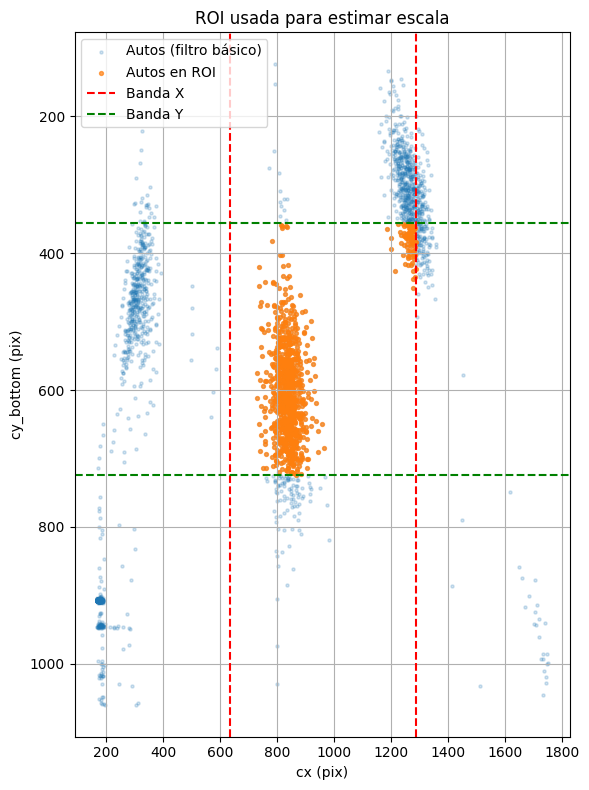


Ejemplos de escalas por auto:
  gt_id=33: s_car=9.899 m/u
  gt_id=36: s_car=10.053 m/u
  gt_id=40: s_car=9.824 m/u
  gt_id=43: s_car=9.900 m/u
  gt_id=44: s_car=9.806 m/u
  gt_id=46: s_car=9.847 m/u
  gt_id=72: s_car=10.011 m/u
  gt_id=77: s_car=9.997 m/u
  gt_id=80: s_car=10.164 m/u
  gt_id=82: s_car=9.910 m/u

Total autos usados: 64
 inliers: 64

Escala global estimada (mediana): s = 9.9411 m/u

Escala global aprendida en TRAIN: 9.94112491607666

Velocidades calculadas:
  Vehículos en TRAIN: 451


In [35]:

df_train_tracks = pd.read_csv("data/processed/video3/train_video3.csv")

print("Frames en train:", len(df_train_tracks))


s_global, scales_per_car = estimate_global_scale_from_dataset(
    df=df_train_tracks,
    pixel_to_world_fn=pixel_to_world_from_yolo,
    car_width_m=1.9,
    car_class_ids=(0,),
    min_conf=0.5,
    min_bbox_w_px=335,
    max_bbox_w_px=375,
    min_frames_per_car=5,
    x_left_trim_ratio=0.33,
    x_right_trim_ratio=0.33,
    y_top_trim_ratio=0.33,
    y_bottom_trim_ratio=0.33,
    img_width=1920,
    img_height=1080,
    plot_roi=True
)


print("\nEscala global aprendida en TRAIN:", s_global)

# --- TRAIN ---
df_vel_train, df_stats_train = compute_speeds_for_all_cars(
    df=df_train_tracks,
    pixel_to_world_fn=pixel_to_world_from_yolo,
    s_global=s_global,  
    fps=25.0,               
    car_class_ids=(0,),
    cy_quantile=0.3,
    min_frames_per_car=5,
)



df_vel_train.to_csv("data/processed/video3/video3_speeds_per_frame_train.csv", index=False)
df_stats_train.to_csv("data/processed/video3/speeds_per_vehicle_train.csv", index=False)

print("\nVelocidades calculadas:")
print("  Vehículos en TRAIN:", len(df_stats_train))




Métricas usando la MEDIA por auto [train]:
  MAE   (km/h): 23.76
  MedAE (km/h): 25.07
  RMSE  (km/h): 24.52
  MAPE    (%): 56.18
  R²         : -4.610
  Vehículos evaluados: 451


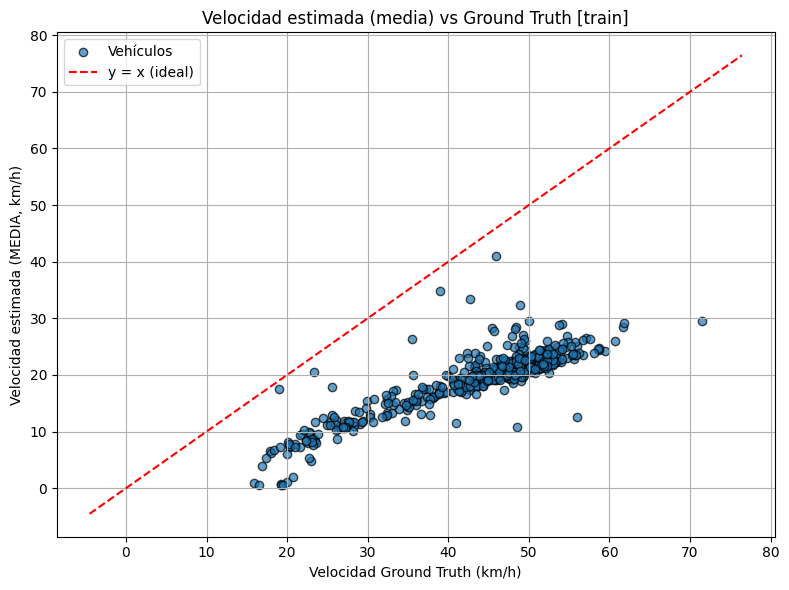

In [20]:


df_gt = pd.read_csv("data/processed/video3/gt/gt_video3_processed.csv").rename(
    columns={"vehicle_id": "gt_id", "speed": "speed_gt_kmh"}
)
df_gt["speed_gt_kmh"] = pd.to_numeric(df_gt["speed_gt_kmh"], errors="coerce")


evaluate_split(df_stats_train, df_gt, split_name="train")




Factor de escala global α aprendido en TRAIN (a partir de la PRIMERA predicción): 2.200
Media GT (train):        42.69680709534369
Media pred (train):      18.933738140654146
Media pred*α (train):    41.649627196562065

Métricas usando la MEDIA por auto [train]:
  MAE   (km/h): 3.95
  MedAE (km/h): 3.06
  RMSE  (km/h): 6.19
  MAPE    (%): 10.83
  R²         : 0.642
  Vehículos evaluados: 451


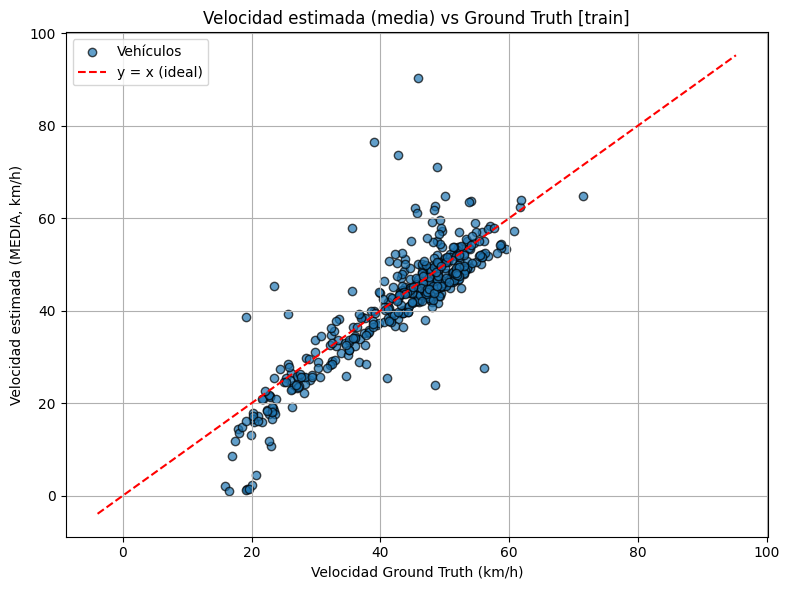

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


df_gt = pd.read_csv("data/processed/video3/gt/gt_video3_processed.csv").rename(
    columns={"vehicle_id": "gt_id", "speed": "speed_gt_kmh"}
)
df_gt["speed_gt_kmh"] = pd.to_numeric(df_gt["speed_gt_kmh"], errors="coerce")




df_eval_train = df_stats_train.merge(df_gt, on="gt_id", how="inner")
mask = (~df_eval_train["speed_kmh_mean"].isna()) & (~df_eval_train["speed_gt_kmh"].isna())
df_eval_train = df_eval_train[mask].copy()

y_true_train = df_eval_train["speed_gt_kmh"].values
y_pred_train = df_eval_train["speed_kmh_mean"].values

alpha = np.sum(y_true_train * y_pred_train) / np.sum(y_pred_train ** 2)

print(f"\nFactor de escala global α aprendido en TRAIN (a partir de la PRIMERA predicción): {alpha:.3f}")
print("Media GT (train):       ", y_true_train.mean())
print("Media pred (train):     ", y_pred_train.mean())
print("Media pred*α (train):   ", (alpha * y_pred_train).mean())


df_stats_train_scaled = df_stats_train.copy()


df_stats_train_scaled["speed_kmh_mean"] *= alpha





evaluate_split(df_stats_train_scaled, df_gt, split_name="train")

df_stats_train_scaled.to_csv("data/processed/video3/speeds_per_vehicle_train_scaled.csv", index=False)

## Test


In [ ]:


csv_path, video_dir = run_yolo_tracking(
    weights_path="src./finetuned-detrac-weights.pt",
    video_source="data/raw/video1/video1_raw.mp4",
    base_dir="data/processed/video1",
    csv_filename="video1_track.csv",
    run_name="yolo_track_video1",
    conf=0.5,
    iou=0.6,
)



video 1/1 (frame 1/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video1\video1_raw.mp4: 384x640 2 cars, 64.5ms
video 1/1 (frame 2/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video1\video1_raw.mp4: 384x640 2 cars, 10.8ms
video 1/1 (frame 3/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video1\video1_raw.mp4: 384x640 2 cars, 7.4ms
video 1/1 (frame 4/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video1\video1_raw.mp4: 384x640 1 car, 10.4ms
video 1/1 (frame 5/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video1\video1_raw.mp4: 384x640 (no detections), 11.2ms
video 1/1 (frame 6/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video1\video1_raw.mp4: 384x640 (no detections), 10.5ms
video 1/1 (frame 7/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video1\video1_raw.mp4: 384x640 (no detecti

In [22]:


prepare_ground_truth_with_speed(
    input_xml="data/raw/video1/gt_video1_raw.xml",
    filtered_xml="data/processed/video1/gt/gt_video1_processed.xml",
    output_csv="data/processed/video1/gt/gt_video1_processed.csv"
)


df_aligned, mapping = align_yolo_with_ground_truth(
    yolo_tracks_csv="data/processed/video1/video1_track.csv",
    gt_csv="data/processed/video1/gt/gt_video1_processed.csv",
    output_aligned_csv="data/processed/video1/video1_track_id.csv",
    frame_tolerance=1,
)


df_all_stable = filter_all_tracks(
    input_csv="data/processed/video1/video1_track_id.csv",
    output_csv="data/processed/video1/video1_track_id_filtered.csv",
    orig_h=1080,
    margin_bottom_px=20,
    margin_top_px=50,  
)



df_train, df_test = prepare_frame_level_train_test(
    tracks_csv="data/processed/video1/video1_track_id_filtered.csv",
    gt_csv="data/processed/video1/gt/gt_video1_processed.csv",
    fps=25.0,
    test_size=1.0,
    random_seed=42,
    train_out="data/processed/video1/train_video1.csv",
    test_out="data/processed/video1/test_video1.csv",
    min_frames_per_gt=None,   
)



[filter_vehicles_with_radar] Vehículos totales en data/raw/video1/gt_video1_raw.xml: 119
[filter_vehicles_with_radar] Vehículos sin radar eliminados: 9
[filter_vehicles_with_radar] Vehículos restantes con radar: 110
[filter_vehicles_with_radar] XML filtrado guardado en: data/processed/video1/gt/gt_video1_processed.xml
[convert_xml_to_csv] Vehículos procesados: 110
[convert_xml_to_csv] CSV guardado en: data/processed/video1/gt/gt_video1_processed.csv
Coincidencias encontradas: 107 de 110 vehículos GT
Total de vehículos únicos preservados: 107

Proceso de alineación completado.
Tracks encontrados: [  5   6  15  18  19  20  21  26  30  33  34  37  44  49  50  58  60  61  65  69  70  73  94 107 109 112 117 123 124 129 134 140 141 148 149 151 152 155 159 163 169 170 171 177 179 180 181 183 186 187 188 190 193 194 197 198 199 200 206 208 209 213 214 215 216 217 236 254 255 261 285 292 296 299 300 310 312 314 315
 318 322 326 337 338 339 343 344 345 349 350 352 362 363 368 380 383 391 392 393


Métricas usando la MEDIA por auto [test]:
  MAE   (km/h): 25.97
  MedAE (km/h): 27.59
  RMSE  (km/h): 26.72
  MAPE    (%): 58.80
  R²         : -4.735
  Vehículos evaluados: 105


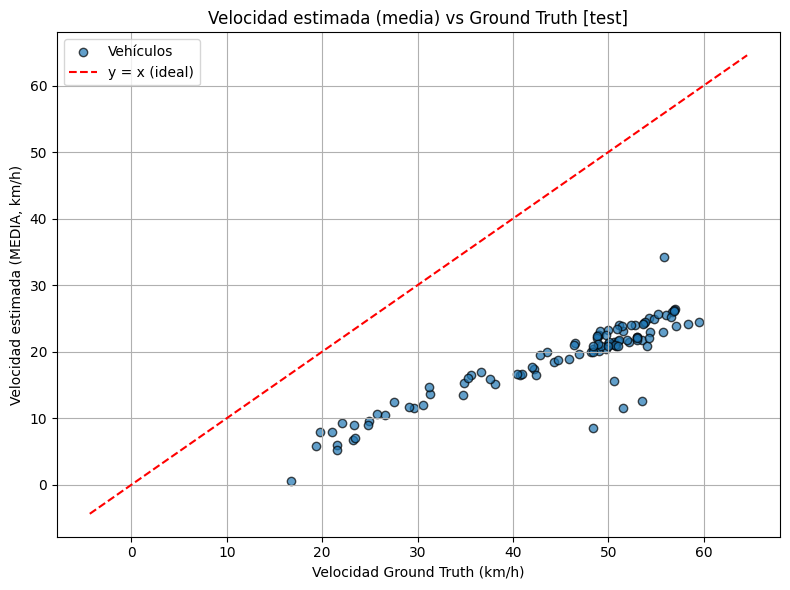


Métricas usando la MEDIA por auto [test]:
  MAE   (km/h): 4.14
  MedAE (km/h): 3.48
  RMSE  (km/h): 6.58
  MAPE    (%): 10.67
  R²         : 0.652
  Vehículos evaluados: 105


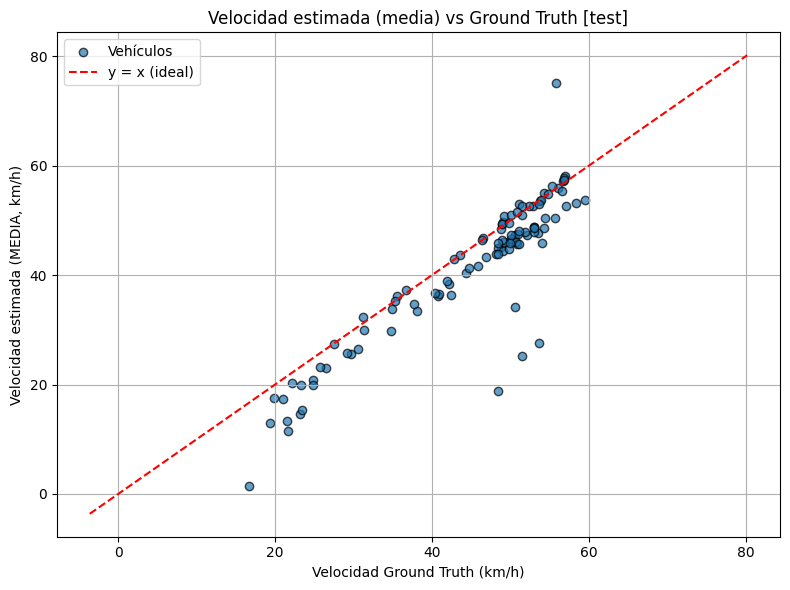

In [28]:
df_test_tracks = pd.read_csv("data/processed/video1/test_video1.csv")

df_vel_test, df_stats_test = compute_speeds_for_all_cars(
    df=df_test_tracks,
    pixel_to_world_fn=pixel_to_world_from_yolo,
    s_global=s_global,  
    fps=25.0,               
    car_class_ids=(0,),
    cy_quantile=0.3,
    min_frames_per_car=5,
)


df_vel_test.to_csv("data/processed/video1/video1_speeds_per_frame_test.csv", index=False)
df_stats_test.to_csv("data/processed/video1/speeds_per_vehicle_test.csv", index=False)


df_gt = pd.read_csv("data/processed/video1/gt/gt_video1_processed.csv").rename(
    columns={"vehicle_id": "gt_id", "speed": "speed_gt_kmh"}
)
df_gt["speed_gt_kmh"] = pd.to_numeric(df_gt["speed_gt_kmh"], errors="coerce")


evaluate_split(df_stats_test, df_gt, split_name="test")



df_stats_test_scaled = df_stats_test.copy()


df_stats_test_scaled["speed_kmh_mean"] *= alpha

evaluate_split(df_stats_test_scaled, df_gt, split_name="test")

df_stats_test_scaled.to_csv("data/processed/video1/speeds_per_vehicle_test_scaled.csv", index=False)

In [19]:


csv_path, video_dir = run_yolo_tracking(
    weights_path="src./finetuned-detrac-weights.pt",
    video_source="data/raw/video2/video2_raw.mp4",
    base_dir="data/processed/video2",
    csv_filename="video2_track.csv",
    run_name="yolo_track_video2",
    conf=0.5,
    iou=0.6,
)



video 1/1 (frame 1/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 8.7ms
video 1/1 (frame 2/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 9.0ms
video 1/1 (frame 3/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 10.8ms
video 1/1 (frame 4/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 7.4ms
video 1/1 (frame 5/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 11.0ms
video 1/1 (frame 6/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 7.4ms
video 1/1 (frame 7/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 7.4ms
video 1/1 (frame 

In [24]:


prepare_ground_truth_with_speed(
    input_xml="data/raw/video2/gt_video2_raw.xml",
    filtered_xml="data/processed/video2/gt/gt_video2_processed.xml",
    output_csv="data/processed/video2/gt/gt_video2_processed.csv"
)


df_aligned, mapping = align_yolo_with_ground_truth(
    yolo_tracks_csv="data/processed/video2/video2_track.csv",
    gt_csv="data/processed/video2/gt/gt_video2_processed.csv",
    output_aligned_csv="data/processed/video2/video2_track_id.csv",
    frame_tolerance=1,
)


df_all_stable = filter_all_tracks(
    input_csv="data/processed/video2/video2_track_id.csv",
    output_csv="data/processed/video2/video2_track_id_filtered.csv",
    orig_h=1080,
    margin_bottom_px=20,
    margin_top_px=50,  
)



df_train, df_test = prepare_frame_level_train_test(
    tracks_csv="data/processed/video2/video2_track_id_filtered.csv",
    gt_csv="data/processed/video2/gt/gt_video2_processed.csv",
    fps=25.0,
    test_size=1.0,
    random_seed=42,
    train_out="data/processed/video2/train_video2.csv",
    test_out="data/processed/video2/test_video2.csv",
    min_frames_per_gt=None,   
)



[filter_vehicles_with_radar] Vehículos totales en data/raw/video2/gt_video2_raw.xml: 168
[filter_vehicles_with_radar] Vehículos sin radar eliminados: 16
[filter_vehicles_with_radar] Vehículos restantes con radar: 152
[filter_vehicles_with_radar] XML filtrado guardado en: data/processed/video2/gt/gt_video2_processed.xml
[convert_xml_to_csv] Vehículos procesados: 152
[convert_xml_to_csv] CSV guardado en: data/processed/video2/gt/gt_video2_processed.csv
Coincidencias encontradas: 148 de 152 vehículos GT
Total de vehículos únicos preservados: 148

Proceso de alineación completado.
Tracks encontrados: [  1   3   9  14  21  22  26  27  29  30  40  45  48  50  51  52  55  57  58  60  62  71  77  78  86  88  91  94  96 103 106 127 154 155 156 157 159 163 167 170 176 181 183 193 198 208 211 214 220 221 222 224 225 227 228 237 245 246 247 248 250 258 259 260 263 271 306 313 314 315 327 329 332 337 341 344 347 353 355
 360 368 370 373 374 376 411 428 430 431 433 436 442 445 449 450 453 459 462 46


Métricas usando la MEDIA por auto [test]:
  MAE   (km/h): 26.49
  MedAE (km/h): 27.62
  RMSE  (km/h): 27.01
  MAPE    (%): 58.28
  R²         : -6.757
  Vehículos evaluados: 144


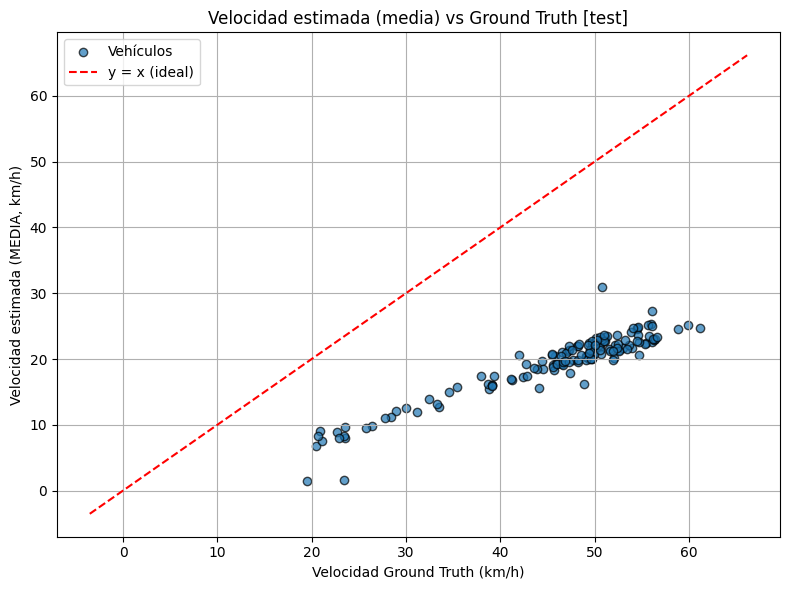


Métricas usando la MEDIA por auto [test]:
  MAE   (km/h): 3.69
  MedAE (km/h): 3.74
  RMSE  (km/h): 4.86
  MAPE    (%): 9.09
  R²         : 0.749
  Vehículos evaluados: 144


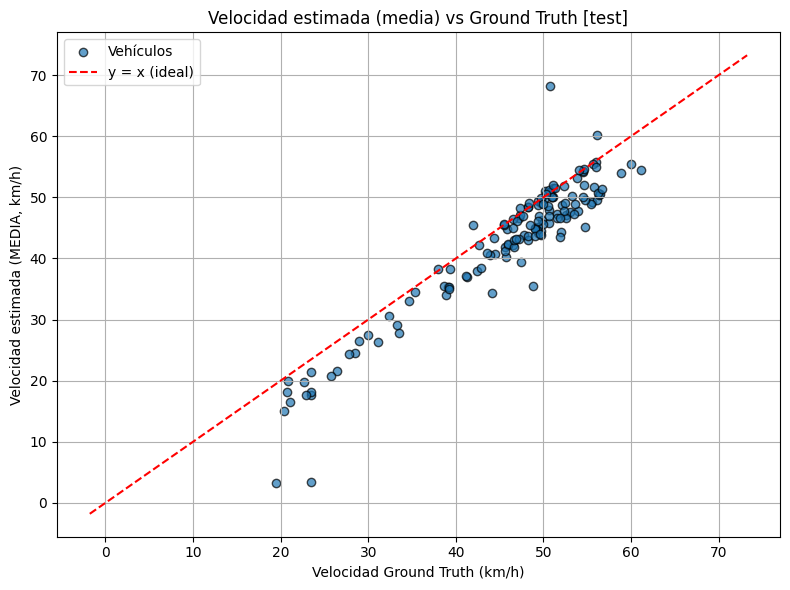

In [29]:
df_test_tracks = pd.read_csv("data/processed/video2/test_video2.csv")

df_vel_test, df_stats_test = compute_speeds_for_all_cars(
    df=df_test_tracks,
    pixel_to_world_fn=pixel_to_world_from_yolo,
    s_global=s_global,  
    fps=25.0,               
    car_class_ids=(0,),
    cy_quantile=0.3,
    min_frames_per_car=5,
)


df_vel_test.to_csv("data/processed/video2/video2_speeds_per_frame_test.csv", index=False)
df_stats_test.to_csv("data/processed/video2/speeds_per_vehicle_test.csv", index=False)


df_gt = pd.read_csv("data/processed/video2/gt/gt_video2_processed.csv").rename(
    columns={"vehicle_id": "gt_id", "speed": "speed_gt_kmh"}
)
df_gt["speed_gt_kmh"] = pd.to_numeric(df_gt["speed_gt_kmh"], errors="coerce")


evaluate_split(df_stats_test, df_gt, split_name="test")



df_stats_test_scaled = df_stats_test.copy()


df_stats_test_scaled["speed_kmh_mean"] *= alpha

evaluate_split(df_stats_test_scaled, df_gt, split_name="test")

df_stats_test_scaled.to_csv("data/processed/video2/speeds_per_vehicle_test_scaled.csv", index=False)

In [3]:


csv_path, video_dir = run_yolo_tracking(
    weights_path="src./finetuned-detrac-weights.pt",
    video_source="data/raw/video4/video4_raw.mp4",
    base_dir="data/processed/video4",
    csv_filename="video4_track.csv",
    run_name="yolo_track_video4",
    conf=0.5,
    iou=0.6,
)



video 1/1 (frame 1/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video4\video4_raw.mp4: 384x640 1 car, 75.9ms
video 1/1 (frame 2/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video4\video4_raw.mp4: 384x640 1 car, 7.2ms
video 1/1 (frame 3/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video4\video4_raw.mp4: 384x640 1 car, 8.6ms
video 1/1 (frame 4/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video4\video4_raw.mp4: 384x640 1 car, 8.3ms
video 1/1 (frame 5/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video4\video4_raw.mp4: 384x640 1 car, 10.1ms
video 1/1 (frame 6/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video4\video4_raw.mp4: 384x640 1 car, 11.2ms
video 1/1 (frame 7/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_bbox\data\raw\video4\video4_raw.mp4: 384x640 1 car, 10.5ms
video 1/1 (fram

In [26]:


prepare_ground_truth_with_speed(
    input_xml="data/raw/video4/gt_video4_raw.xml",
    filtered_xml="data/processed/video4/gt/gt_video4_processed.xml",
    output_csv="data/processed/video4/gt/gt_video4_processed.csv"
)


df_aligned, mapping = align_yolo_with_ground_truth(
    yolo_tracks_csv="data/processed/video4/video4_track.csv",
    gt_csv="data/processed/video4/gt/gt_video4_processed.csv",
    output_aligned_csv="data/processed/video4/video4_track_id.csv",
    frame_tolerance=1,
)


df_all_stable = filter_all_tracks(
    input_csv="data/processed/video4/video4_track_id.csv",
    output_csv="data/processed/video4/video4_track_id_filtered.csv",
    orig_h=1080,
    margin_bottom_px=20,
    margin_top_px=50,  
)



df_train, df_test = prepare_frame_level_train_test(
    tracks_csv="data/processed/video4/video4_track_id_filtered.csv",
    gt_csv="data/processed/video4/gt/gt_video4_processed.csv",
    fps=25.0,
    test_size=1.0,
    random_seed=42,
    train_out="data/processed/video4/train_video4.csv",
    test_out="data/processed/video4/test_video4.csv",
    min_frames_per_gt=None,   
)



[filter_vehicles_with_radar] Vehículos totales en data/raw/video4/gt_video4_raw.xml: 163
[filter_vehicles_with_radar] Vehículos sin radar eliminados: 19
[filter_vehicles_with_radar] Vehículos restantes con radar: 144
[filter_vehicles_with_radar] XML filtrado guardado en: data/processed/video4/gt/gt_video4_processed.xml
[convert_xml_to_csv] Vehículos procesados: 144
[convert_xml_to_csv] CSV guardado en: data/processed/video4/gt/gt_video4_processed.csv
Coincidencias encontradas: 142 de 144 vehículos GT
Total de vehículos únicos preservados: 142

Proceso de alineación completado.
Tracks encontrados: [  4   8  10  18  20  24  28  31  39  43  50  57  58  64  65  67  74 111 124 125 127 128 131 133 134 138 139 141 145 150 155 169 185 191 193 194 197 198 201 207 211 218 225 232 236 239 245 246 247 252 256 259 261 266 267 273 275 276 279 284 285 291 292 295 300 303 311 313 315 317 318 319 322 325 329 330 362 364 367
 368 369 370 373 374 376 377 380 381 385 388 398 402 408 409 424 425 426 437 43


Métricas usando la MEDIA por auto [test]:
  MAE   (km/h): 27.49
  MedAE (km/h): 28.24
  RMSE  (km/h): 27.97
  MAPE    (%): 56.36
  R²         : -7.107
  Vehículos evaluados: 138


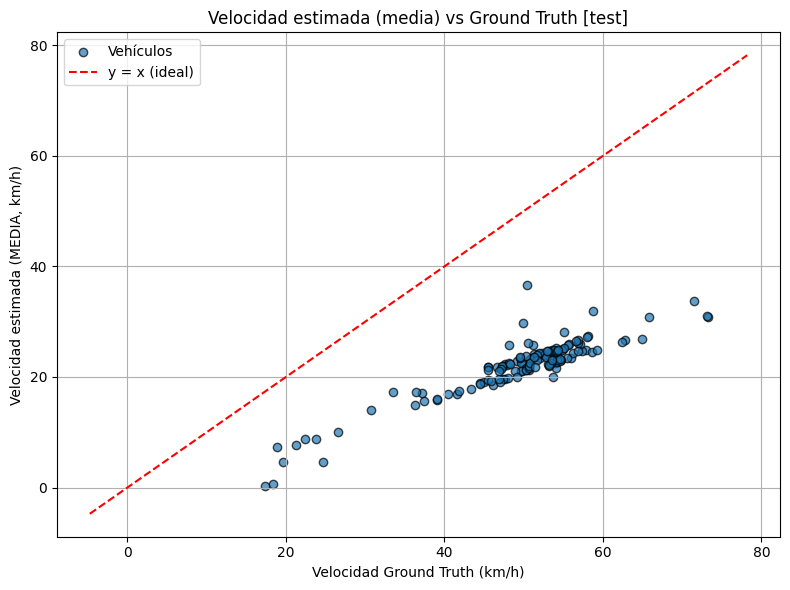


Métricas usando la MEDIA por auto [test]:
  MAE   (km/h): 3.35
  MedAE (km/h): 2.77
  RMSE  (km/h): 5.07
  MAPE    (%): 8.24
  R²         : 0.734
  Vehículos evaluados: 138


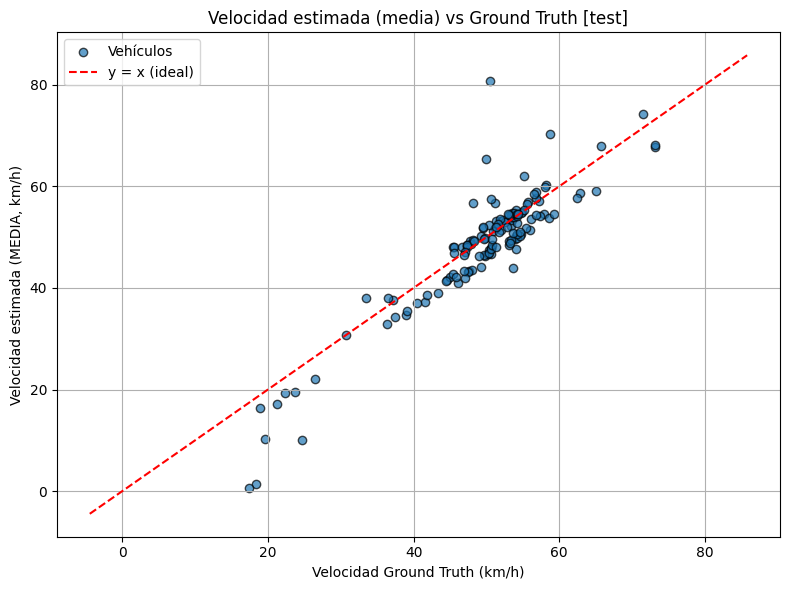

In [30]:
df_test_tracks = pd.read_csv("data/processed/video4/test_video4.csv")

df_vel_test, df_stats_test = compute_speeds_for_all_cars(
    df=df_test_tracks,
    pixel_to_world_fn=pixel_to_world_from_yolo,
    s_global=s_global,  
    fps=25.0,               
    car_class_ids=(0,),
    cy_quantile=0.3,
    min_frames_per_car=5,
)


df_vel_test.to_csv("data/processed/video4/video4_speeds_per_frame_test.csv", index=False)
df_stats_test.to_csv("data/processed/video4/speeds_per_vehicle_test.csv", index=False)


df_gt = pd.read_csv("data/processed/video4/gt/gt_video4_processed.csv").rename(
    columns={"vehicle_id": "gt_id", "speed": "speed_gt_kmh"}
)
df_gt["speed_gt_kmh"] = pd.to_numeric(df_gt["speed_gt_kmh"], errors="coerce")


evaluate_split(df_stats_test, df_gt, split_name="test")



df_stats_test_scaled = df_stats_test.copy()


df_stats_test_scaled["speed_kmh_mean"] *= alpha

evaluate_split(df_stats_test_scaled, df_gt, split_name="test")

df_stats_test_scaled.to_csv("data/processed/video4/speeds_per_vehicle_test_scaled.csv", index=False)

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    mean_absolute_error, median_absolute_error, 
    mean_squared_error, r2_score, confusion_matrix
)

datasets = {
    "video1": {
        "gt":   "data/processed/video1/gt/gt_video1_processed.csv",
        "pred": "data/processed/video1/speeds_per_vehicle_test_scaled.csv"
    },
    "video2": {
        "gt":   "data/processed/video2/gt/gt_video2_processed.csv",
        "pred": "data/processed/video2/speeds_per_vehicle_test_scaled.csv"
    },
    "video4": {
        "gt":   "data/processed/video4/gt/gt_video4_processed.csv",
        "pred": "data/processed/video4/speeds_per_vehicle_test_scaled.csv"
    },
}

dfs = []

for video_id, paths in datasets.items():
    # Cargar archivos
    gt = pd.read_csv(paths["gt"])
    pred = pd.read_csv(paths["pred"])

    # Convertir a string los IDs para evitar errores de merge
    gt["vehicle_id"] = gt["vehicle_id"].astype(str)
    pred["gt_id"]    = pred["gt_id"].astype(str)

    # Crear unique_id
    gt["unique_id"]  = video_id + "_" + gt["vehicle_id"]
    pred["unique_id"] = video_id + "_" + pred["gt_id"]

    # El GT tiene la velocidad real en la columna "speed"
    gt = gt[["unique_id", "speed"]].rename(columns={"speed": "speed_gt"})

    # Merge 1-a-1
    df = pred.merge(gt, on="unique_id", how="inner")

    # Guardar el id del video
    df["video_id"] = video_id

    dfs.append(df)

df_all = pd.concat(dfs, ignore_index=True)
print("Vehículos totales combinados:", len(df_all))

gt = df_all["speed_gt"].values
pred = df_all["speed_kmh_mean"].values

mae  = mean_absolute_error(gt, pred)
medae = median_absolute_error(gt, pred)
rmse = np.sqrt(mean_squared_error(gt, pred))
r2 = r2_score(gt, pred)
mape = np.mean(np.abs((gt - pred) / gt)) * 100

print("\n===== MÉTRICAS GLOBALES =====")
print(f"MAE   (km/h): {mae:.2f}")
print(f"MedAE (km/h): {medae:.2f}")
print(f"RMSE  (km/h): {rmse:.2f}")
print(f"MAPE    (%): {mape:.2f}")
print(f"R²         : {r2:.3f}")
print(f"Vehículos evaluados: {len(df_all)}")



Vehículos totales combinados: 387

===== MÉTRICAS GLOBALES =====
MAE   (km/h): 3.69
MedAE (km/h): 3.41
RMSE  (km/h): 5.45
MAPE    (%): 9.22
R²         : 0.723
Vehículos evaluados: 387


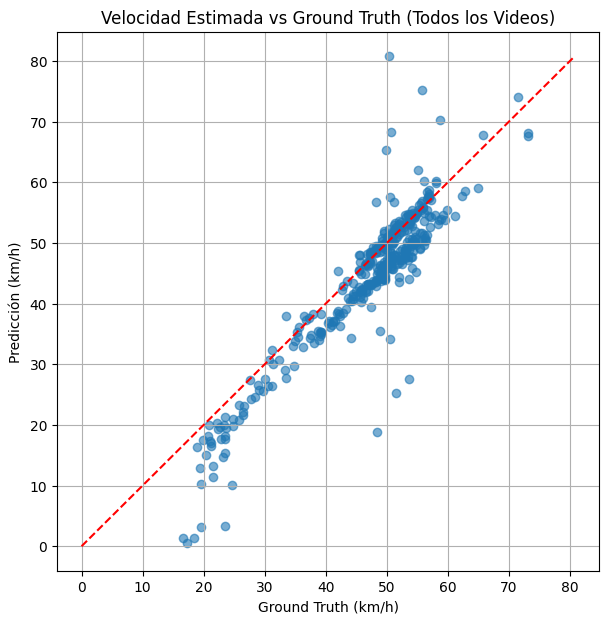

In [32]:
plt.figure(figsize=(7,7))
plt.scatter(gt, pred, alpha=0.6)

max_v = max(gt.max(), pred.max())
plt.plot([0, max_v], [0, max_v], 'r--')

plt.xlabel("Ground Truth (km/h)")
plt.ylabel("Predicción (km/h)")
plt.title("Velocidad Estimada vs Ground Truth (Todos los Videos)")
plt.grid(True)
plt.show()


In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    mean_absolute_error, median_absolute_error, 
    mean_squared_error, r2_score, confusion_matrix
)

datasets = {
    "video1": {
        "gt":   "data/processed/video1/gt/gt_video1_processed.csv",
        "pred": "data/processed/video1/speeds_per_vehicle_test.csv"
    },
    "video2": {
        "gt":   "data/processed/video2/gt/gt_video2_processed.csv",
        "pred": "data/processed/video2/speeds_per_vehicle_test.csv"
    },
    "video4": {
        "gt":   "data/processed/video4/gt/gt_video4_processed.csv",
        "pred": "data/processed/video4/speeds_per_vehicle_test.csv"
    },
}

dfs = []

for video_id, paths in datasets.items():
    # Cargar archivos
    gt = pd.read_csv(paths["gt"])
    pred = pd.read_csv(paths["pred"])

    # Convertir a string los IDs para evitar errores de merge
    gt["vehicle_id"] = gt["vehicle_id"].astype(str)
    pred["gt_id"]    = pred["gt_id"].astype(str)

    # Crear unique_id
    gt["unique_id"]  = video_id + "_" + gt["vehicle_id"]
    pred["unique_id"] = video_id + "_" + pred["gt_id"]

    # El GT tiene la velocidad real en la columna "speed"
    gt = gt[["unique_id", "speed"]].rename(columns={"speed": "speed_gt"})

    # Merge 1-a-1
    df = pred.merge(gt, on="unique_id", how="inner")

    # Guardar el id del video
    df["video_id"] = video_id

    dfs.append(df)

df_all = pd.concat(dfs, ignore_index=True)
print("Vehículos totales combinados:", len(df_all))

gt = df_all["speed_gt"].values
pred = df_all["speed_kmh_mean"].values

mae  = mean_absolute_error(gt, pred)
medae = median_absolute_error(gt, pred)
rmse = np.sqrt(mean_squared_error(gt, pred))
r2 = r2_score(gt, pred)
mape = np.mean(np.abs((gt - pred) / gt)) * 100

print("\n===== MÉTRICAS GLOBALES =====")
print(f"MAE   (km/h): {mae:.2f}")
print(f"MedAE (km/h): {medae:.2f}")
print(f"RMSE  (km/h): {rmse:.2f}")
print(f"MAPE    (%): {mape:.2f}")
print(f"R²         : {r2:.3f}")
print(f"Vehículos evaluados: {len(df_all)}")



Vehículos totales combinados: 387

===== MÉTRICAS GLOBALES =====
MAE   (km/h): 26.70
MedAE (km/h): 27.86
RMSE  (km/h): 27.28
MAPE    (%): 57.74
R²         : -5.948
Vehículos evaluados: 387


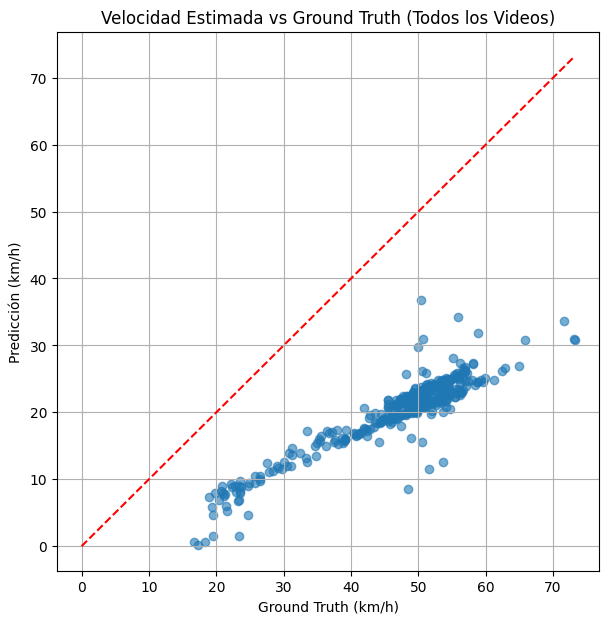

In [37]:
plt.figure(figsize=(7,7))
plt.scatter(gt, pred, alpha=0.6)

max_v = max(gt.max(), pred.max())
plt.plot([0, max_v], [0, max_v], 'r--')

plt.xlabel("Ground Truth (km/h)")
plt.ylabel("Predicción (km/h)")
plt.title("Velocidad Estimada vs Ground Truth (Todos los Videos)")
plt.grid(True)
plt.show()
